Redo day night analysis by spreading the number of fish caught equally for all hours the trap was in 

Pseudocode - 

First make dataframe df1 with hourly datetime column. Then read data as df2. Make a new datetime column with hour. Then 'combine' df1 and df2. 

In [1]:
#imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sys import platform
import matplotlib.gridspec as gridspec
import datetime

In [2]:
if platform == "linux" or platform == "linux2":
    data_string = "/home/maria/Documents/data/pied_piper/"
    output_string = "/home/maria/Documents/output/pied_piper/"
else:
    data_string = "C:/Users/maria/OneDrive/Documents/data/pied_piper/"
    output_string = "C:/Users/maria/OneDrive/Documents/output/pied_piper/"

In [3]:
df2 = pd.read_csv(data_string + "combine_2005-2020_dungeness_all.csv", header = 0)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df2) 

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,chinook1_wild_perhour,coho1_hatchery_perhour,coho1_wild_perhour,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,chinook0_hatchery_perhour,chinook0_wild_num,chinook0_hatchery_num,chinook1_hatchery_num,chinook1_wild_num,coho1_hatchery_num,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour
0,0,2005-03-08 16:30:00,2005-03-09 12:14:00,19.733333,2005-03-08,2005-03-09 02:22:00,7.000000,154.0,4.358108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,106.0,268.0,5.371622,13.581081
1,1,2005-03-09 13:06:00,2005-03-09 18:20:00,5.233333,2005-03-09,2005-03-09 15:43:00,8.800000,177.0,0.191083,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,30.0,0.382166,5.732484
2,2,2005-03-09 18:20:00,2005-03-09 20:13:00,1.883333,2005-03-09,2005-03-09 19:16:30,7.900000,180.0,3.716814,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,165.0,17.522124,87.610619
3,3,2005-03-09 20:13:00,2005-03-10 08:41:00,12.466667,2005-03-09,2005-03-10 02:27:00,6.700000,181.0,4.251337,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,599.0,4.491979,48.048128
4,4,2005-03-10 08:41:00,2005-03-10 17:47:00,9.100000,2005-03-10,2005-03-10 13:14:00,7.600000,179.0,0.109890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,34.0,0.219780,3.736264
5,5,2005-03-10 17:47:00,2005-03-11 07:59:00,14.200000,2005-03-10,2005-03-11 00:53:00,6.800000,171.0,1.690141,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,528.0,2.676056,37.183099
6,6,2005-03-11 07:59:00,2005-03-11 15:45:00,7.766667,2005-03-11,2005-03-11 11:52:00,7.300000,173.0,1.416309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,59.0,0.128755,7.596567
7,7,2005-03-11 15:45:00,2005-03-11 19:18:00,3.550000,2005-03-11,2005-03-11 17:31:30,8.100000,169.0,2.253521,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,7.0,1.126761,1.971831
8,8,2005-03-11 19:18:00,2005-03-12 08:15:00,12.950000,2005-03-11,2005-03-12 01:46:30,6.600000,166.0,7.722008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70.0,972.0,5.405405,75.057915
9,9,2005-03-12 08:15:00,2005-03-12 18:06:00,9.850000,2005-03-12,2005-03-12 13:10:30,8.200000,171.0,0.101523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,9.0,0.406091,0.913706


In [4]:

# Convert the existing datetime column to pandas datetime format
df2['Up'] = pd.to_datetime(df2['Up'])

# Round the datetime column to the closest hour
df2['Rounded_Up'] = df2['Up'].dt.round('H')

# Convert the existing datetime column to pandas datetime format
df2['Down'] = pd.to_datetime(df2['Down'])

# Round the datetime column to the closest hour
df2['Rounded_Down'] = df2['Down'].dt.round('H')


# Print the resulting DataFrame
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(df2)

,Unnamed: 0,Down,Up,In,Date,midpoint,temp,flow,chinook0_wild_perhour,chinook1_hatchery_perhour,chinook1_wild_perhour,coho1_hatchery_perhour,coho1_wild_perhour,steelheadsmolt_hatchery_perhour,steelheadsmolt_wild_perhour,chinook0_hatchery_perhour,chinook0_wild_num,chinook0_hatchery_num,chinook1_hatchery_num,chinook1_wild_num,coho1_hatchery_num,coho1_wild_num,steelheadsmolt_hatchery_num,steelheadsmolt_wild_num,pink0_wild_num,chum0_wild_num,pink0_wild_perhour,chum0_wild_perhour,Rounded_Up,Rounded_Down
0,0,2005-03-08 16:30:00.000000000,2005-03-09 12:14:00.000000000,19.733333,2005-03-08,2005-03-09 02:22:00,7.000000,154.0,4.358108,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,86.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,106.0,268.0,5.371622,13.581081,2005-03-09 12:00:00,2005-03-08 16:00:00
1,1,2005-03-09 13:06:00.000000000,2005-03-09 18:20:00.000000000,5.233333,2005-03-09,2005-03-09 15:43:00,8.800000,177.0,0.191083,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,30.0,0.382166,5.732484,2005-03-09 18:00:00,2005-03-09 13:00:00
2,2,2005-03-09 18:20:00.000000000,2005-03-09 20:13:00.000000000,1.883333,2005-03-09,2005-03-09 19:16:30,7.900000,180.0,3.716814,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,165.0,17.522124,87.610619,2005-03-09 20:00:00,2005-03-09 18:00:00
3,3,2005-03-09 20:13:00.000000000,2005-03-10 08:41:00.000000000,12.466667,2005-03-09,2005-03-10 02:27:00,6.700000,181.0,4.251337,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,56.0,599.0,4.491979,48.048128,2005-03-10 09:00:00,2005-03-09 20:00:00
4,4,2005-03-10 08:41:00.000000000,2005-03-10 17:47:00.000000000,9.100000,2005-03-10,2005-03-10 13:14:00,7.600000,179.0,0.109890,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,34.0,0.219780,3.736264,2005-03-10 18:00:00,2005-03-10 09:00:00
5,5,2005-03-10 17:47:00.000000000,2005-03-11 07:59:00.000000000,14.200000,2005-03-10,2005-03-11 00:53:00,6.800000,171.0,1.690141,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,38.0,528.0,2.676056,37.183099,2005-03-11 08:00:00,2005-03-10 18:00:00
6,6,2005-03-11 07:59:00.000000000,2005-03-11 15:45:00.000000000,7.766667,2005-03-11,2005-03-11 11:52:00,7.300000,173.0,1.416309,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,59.0,0.128755,7.596567,2005-03-11 16:00:00,2005-03-11 08:00:00
7,7,2005-03-11 15:45:00.000000000,2005-03-11 19:18:00.000000000,3.550000,2005-03-11,2005-03-11 17:31:30,8.100000,169.0,2.253521,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,7.0,1.126761,1.971831,2005-03-11 19:00:00,2005-03-11 16:00:00
8,8,2005-03-11 19:18:00.000000000,2005-03-12 08:15:00.000000000,12.950000,2005-03-11,2005-03-12 01:46:30,6.600000,166.0,7.722008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70.0,972.0,5.405405,75.057915,2005-03-12 08:00:00,2005-03-11 19:00:00
9,9,2005-03-12 08:15:00.000000000,2005-03-12 18:06:00.000000000,9.850000,2005-03-12,2005-03-12 13:10:30,8.200000,171.0,0.101523,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,9.0,0.406091,0.913706,2005-03-12 18:00:00,2005-03-12 08:00:00


In [5]:
df2['Hours'] = (df2['Rounded_Up'] - df2['Rounded_Down'])/ np.timedelta64(1, 'h')

In [6]:
# Define the start and end datetime values
# start_datetime = datetime.datetime(2023, 1, 1, 0, 0)  # Replace with your desired start datetime
# end_datetime = datetime.datetime(2023, 1, 2, 0, 0)    # Replace with your desired end datetime

start_datetime = df2['Rounded_Up'][0]
end_datetime = df2['Rounded_Up'][len(df2)-1]

start_datetime_down = df2['Rounded_Down'][0]
end_datetime_down = df2['Rounded_Down'][len(df2)-1]

# Generate the hourly datetime values between start and end
hourly_datetimes = pd.date_range(start=start_datetime_down, end=end_datetime_down, freq='H')

# Create a DataFrame with the datetime column
df = pd.DataFrame({'Datetime': hourly_datetimes})

# Print the resulting DataFrame
print(df)

                  Datetime
0      2005-03-08 16:00:00
1      2005-03-08 17:00:00
2      2005-03-08 18:00:00
3      2005-03-08 19:00:00
4      2005-03-08 20:00:00
...                    ...
135212 2020-08-10 12:00:00
135213 2020-08-10 13:00:00
135214 2020-08-10 14:00:00
135215 2020-08-10 15:00:00
135216 2020-08-10 16:00:00

[135217 rows x 1 columns]


In [7]:
#make new data frame with just datetime and indicator of whether it is down or up

down_df = df2[['Rounded_Down','chinook0_wild_num', 'Hours']]
down_df['chinook0_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['chinook0_wild_num'],df2['chinook0_wild_num']/df2['Hours'])
up_df = df2['Rounded_Up']

merged_df = pd.merge(df, down_df, left_on='Datetime', right_on='Rounded_Down', how='left', indicator="down_merge")

merged_df2 =  pd.merge(merged_df, up_df, left_on='Datetime', right_on='Rounded_Up', how='left', indicator="up_merge")

merged_df2['grouped_down'] =  merged_df2['Rounded_Down'].notnull().cumsum()
merged_df2['grouped_up'] =  merged_df2['Rounded_Up'].notnull().cumsum()
merged_df2['chinook0_wild_perhour_rounded'] = merged_df2['chinook0_wild_perhour_rounded'].ffill()

merged_df2['chinook0_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], np.nan, merged_df2['chinook0_wild_perhour_rounded'])


merged_df2.iloc[1350:1380]
# merged_df2.iloc[0:30]




<ipython-input-7-b7cd276872c6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_wild_perhour_rounded'] = np.where(


,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_wild_perhour_rounded,down_merge,Rounded_Up,up_merge,grouped_down,grouped_up,chinook0_count
1350,2005-05-03 22:00:00,2005-05-03 22:00:00,11.0,5.0,2.2,both,2005-05-03 22:00:00,both,114,113,2.2
1351,2005-05-03 23:00:00,NaT,NaN,NaN,2.2,left_only,NaT,left_only,114,113,2.2
1352,2005-05-04 00:00:00,NaT,NaN,NaN,2.2,left_only,NaT,left_only,114,113,2.2
1353,2005-05-04 01:00:00,NaT,NaN,NaN,2.2,left_only,NaT,left_only,114,113,2.2
1354,2005-05-04 02:00:00,NaT,NaN,NaN,2.2,left_only,NaT,left_only,114,113,2.2
1355,2005-05-04 03:00:00,NaT,NaN,NaN,2.2,left_only,2005-05-04 03:00:00,both,114,114,NaN
1356,2005-05-04 04:00:00,2005-05-04 04:00:00,1.0,1.0,1.0,both,NaT,left_only,115,114,1.0
1357,2005-05-04 05:00:00,NaT,NaN,NaN,1.0,left_only,2005-05-04 05:00:00,both,115,115,NaN
1358,2005-05-04 06:00:00,NaT,NaN,NaN,1.0,left_only,NaT,left_only,115,115,NaN
1359,2005-05-04 07:00:00,NaT,NaN,NaN,1.0,left_only,NaT,left_only,115,115,NaN


In [8]:
chinook0_count = merged_df2[['Datetime', 'chinook0_count']]
chinook0_count[1350:1380]

,Datetime,chinook0_count
1350,2005-05-03 22:00:00,2.2
1351,2005-05-03 23:00:00,2.2
1352,2005-05-04 00:00:00,2.2
1353,2005-05-04 01:00:00,2.2
1354,2005-05-04 02:00:00,2.2
1355,2005-05-04 03:00:00,NaN
1356,2005-05-04 04:00:00,1.0
1357,2005-05-04 05:00:00,NaN
1358,2005-05-04 06:00:00,NaN
1359,2005-05-04 07:00:00,NaN


In [10]:
chinook0_count['Datetime'] = pd.to_datetime(chinook0_count['Datetime'])

# Extract the date and hour components from the "Datetime" column
chinook0_count['Hour'] = chinook0_count['Datetime'].dt.hour


print(chinook0_count)

                  Datetime  chinook0_count  Hour
0      2005-03-08 16:00:00        4.300000    16
1      2005-03-08 17:00:00        4.300000    17
2      2005-03-08 18:00:00        4.300000    18
3      2005-03-08 19:00:00        4.300000    19
4      2005-03-08 20:00:00        4.300000    20
...                    ...             ...   ...
135220 2020-08-10 12:00:00        0.230769    12
135221 2020-08-10 13:00:00        0.230769    13
135222 2020-08-10 14:00:00        0.230769    14
135223 2020-08-10 15:00:00        0.230769    15
135224 2020-08-10 16:00:00        0.375000    16

[135225 rows x 3 columns]


<ipython-input-10-3b85d6191fe9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chinook0_count['Datetime'] = pd.to_datetime(chinook0_count['Datetime'])
<ipython-input-10-3b85d6191fe9>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  chinook0_count['Hour'] = chinook0_count['Datetime'].dt.hour


In [13]:
df_chinook0_wild_hour = chinook0_count.groupby(by = 'Hour').sum()

Text(0, 0.5, 'Sum of wild chinook \n subyearlings caught in trap')

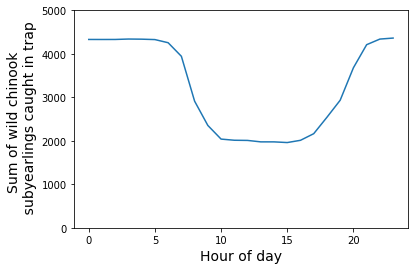

In [28]:
plt.plot(df_chinook0_wild_hour.index, df_chinook0_wild_hour['chinook0_count'])
plt.ylim([0,5000])
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Sum of wild chinook \n subyearlings caught in trap", fontsize = 14)

In [31]:
#repeating for all species and origins

#make new data frame with just datetime and indicator of whether it is down or up

down_df = df2[['Rounded_Down','chinook0_wild_num', 
               'Hours','chinook0_hatchery_num','coho1_wild_num','coho1_hatchery_num',
               'steelheadsmolt_wild_num','steelheadsmolt_hatchery_num']]

#when the trap is put in for less than an hour, then all fish should be assigned to that row
down_df['chinook0_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['chinook0_wild_num'],df2['chinook0_wild_num']/df2['Hours'])

down_df['chinook0_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['chinook0_hatchery_num'],df2['chinook0_hatchery_num']/df2['Hours'])

down_df['coho1_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['coho1_wild_num'],df2['coho1_wild_num']/df2['Hours'])

down_df['coho1_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['coho1_hatchery_num'],df2['coho1_hatchery_num']/df2['Hours'])

down_df['steelheadsmolt_wild_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['steelheadsmolt_wild_num'],df2['steelheadsmolt_wild_num']/df2['Hours'])

down_df['steelheadsmolt_hatchery_perhour_rounded'] = np.where(
    df2['Hours'] == 0, df2['steelheadsmolt_hatchery_num'],df2['steelheadsmolt_hatchery_num']/df2['Hours'])

# down_df['pink0_wild_perhour_rounded'] = np.where(
#     df2['Hours'] == 0, df2['pink0_wild_num'],df2['pink0_wild_num']/df2['Hours'])

# down_df['pink0_hatchery_perhour_rounded'] = np.where(
#     df2['Hours'] == 0, df2['pink0_hatchery_num'],df2['pink0_hatchery_num']/df2['Hours'])



up_df = df2['Rounded_Up']

merged_df = pd.merge(df, down_df, left_on='Datetime', right_on='Rounded_Down', how='left', indicator="down_merge")

merged_df2 =  pd.merge(merged_df, up_df, left_on='Datetime', right_on='Rounded_Up', how='left', indicator="up_merge")

merged_df2['grouped_down'] =  merged_df2['Rounded_Down'].notnull().cumsum()
merged_df2['grouped_up'] =  merged_df2['Rounded_Up'].notnull().cumsum()

merged_df2['chinook0_wild_perhour_rounded'] = merged_df2['chinook0_wild_perhour_rounded'].ffill()
merged_df2['chinook0_hatchery_perhour_rounded'] = merged_df2['chinook0_hatchery_perhour_rounded'].ffill()

merged_df2['coho1_wild_perhour_rounded'] = merged_df2['coho1_wild_perhour_rounded'].ffill()
merged_df2['coho1_hatchery_perhour_rounded'] = merged_df2['coho1_hatchery_perhour_rounded'].ffill()

merged_df2['steelheadsmolt_wild_perhour_rounded'] = merged_df2['steelheadsmolt_wild_perhour_rounded'].ffill()
merged_df2['steelheadsmolt_hatchery_perhour_rounded'] = merged_df2['steelheadsmolt_hatchery_perhour_rounded'].ffill()

# merged_df2['pink0_wild_perhour_rounded'] = merged_df2['pink0_wild_perhour_rounded'].ffill()
# merged_df2['pink0_hatchery_perhour_rounded'] = merged_df2['pink0_hatchery_perhour_rounded'].ffill()




merged_df2['chinook0_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['chinook0_wild_perhour_rounded'])
merged_df2['chinook0_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['chinook0_hatchery_perhour_rounded'])

merged_df2['coho1_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['coho1_wild_perhour_rounded'])
merged_df2['coho1_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['coho1_hatchery_perhour_rounded'])

merged_df2['steelheadsmolt_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['steelheadsmolt_wild_perhour_rounded'])
merged_df2['steelheadsmolt_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
                                        np.nan, merged_df2['steelheadsmolt_hatchery_perhour_rounded'])

# merged_df2['pink0_wild_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
#                                         np.nan, merged_df2['pink0_wild_perhour_rounded'])
# merged_df2['pink0_hatchery_count'] = np.where(merged_df2['grouped_up'] == merged_df2['grouped_down'], 
#                                         np.nan, merged_df2['pink0_hatchery_perhour_rounded'])



merged_df2.iloc[1350:1380]
# merged_df2.iloc[0:30]



<ipython-input-31-43f1919badcd>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_wild_perhour_rounded'] = np.where(
<ipython-input-31-43f1919badcd>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  down_df['chinook0_hatchery_perhour_rounded'] = np.where(
<ipython-input-31-43f1919badcd>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.

,Datetime,Rounded_Down,chinook0_wild_num,Hours,chinook0_hatchery_num,coho1_wild_num,coho1_hatchery_num,steelheadsmolt_wild_num,steelheadsmolt_hatchery_num,chinook0_wild_perhour_rounded,...,Rounded_Up,up_merge,grouped_down,grouped_up,chinook0_wild_count,chinook0_hatchery_count,coho1_wild_count,coho1_hatchery_count,steelheadsmolt_wild_count,steelheadsmolt_hatchery_count
1350,2005-05-03 22:00:00,2005-05-03 22:00:00,11.0,5.0,0.0,67.0,1053.0,6.0,16.0,2.2,...,2005-05-03 22:00:00,both,114,113,2.2,0.0,13.4,210.6,1.2,3.2
1351,2005-05-03 23:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.2,...,NaT,left_only,114,113,2.2,0.0,13.4,210.6,1.2,3.2
1352,2005-05-04 00:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.2,...,NaT,left_only,114,113,2.2,0.0,13.4,210.6,1.2,3.2
1353,2005-05-04 01:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.2,...,NaT,left_only,114,113,2.2,0.0,13.4,210.6,1.2,3.2
1354,2005-05-04 02:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.2,...,NaT,left_only,114,113,2.2,0.0,13.4,210.6,1.2,3.2
1355,2005-05-04 03:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.2,...,2005-05-04 03:00:00,both,114,114,NaN,NaN,NaN,NaN,NaN,NaN
1356,2005-05-04 04:00:00,2005-05-04 04:00:00,1.0,1.0,0.0,3.0,192.0,2.0,1.0,1.0,...,NaT,left_only,115,114,1.0,0.0,3.0,192.0,2.0,1.0
1357,2005-05-04 05:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,2005-05-04 05:00:00,both,115,115,NaN,NaN,NaN,NaN,NaN,NaN
1358,2005-05-04 06:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaT,left_only,115,115,NaN,NaN,NaN,NaN,NaN,NaN
1359,2005-05-04 07:00:00,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaT,left_only,115,115,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
counts = merged_df2[['Datetime', 'chinook0_wild_count', 'chinook0_hatchery_count', 
                     'coho1_wild_count', 'coho1_hatchery_count', 
                     'steelheadsmolt_wild_count', 'steelheadsmolt_hatchery_count']]

counts['Datetime'] = pd.to_datetime(counts['Datetime'])

# Extract the date and hour components from the "Datetime" column
counts['Hour'] = counts['Datetime'].dt.hour

df_hour = counts.groupby(by = 'Hour').sum()

df_hour

<ipython-input-32-05b5367fdc6e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Datetime'] = pd.to_datetime(counts['Datetime'])
<ipython-input-32-05b5367fdc6e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Hour'] = counts['Datetime'].dt.hour


,chinook0_wild_count,chinook0_hatchery_count,coho1_wild_count,coho1_hatchery_count,steelheadsmolt_wild_count,steelheadsmolt_hatchery_count
Hour,,,,,,
0,4331.000166,2897.019404,1073.833418,4509.963607,331.230007,177.597242
1,4330.356119,2891.220595,1077.048894,5332.206464,331.763340,176.704385
2,4330.956119,2891.220595,1074.604450,4500.106464,329.330007,203.204385
3,4340.467230,2891.220595,1061.737783,4289.506464,328.574451,200.004385
4,4337.346775,2881.766049,1064.196117,4481.506464,331.199451,201.004385
5,4328.226285,2875.027954,1058.662855,4289.506464,328.963243,200.004385
6,4255.639859,3006.801940,1010.877288,4242.316382,316.183806,172.905900
7,3943.804605,2914.854668,898.560589,3764.368777,282.489927,146.702706
8,2911.832192,1697.414113,435.905040,3261.620212,156.354271,83.932340


In [38]:
df_hour['chinook0_wild_count_scaled'] = df_hour['chinook0_wild_count']/(
    df_hour['chinook0_wild_count'].max() - df_hour['chinook0_wild_count'].min())

df_hour['chinook0_hatchery_count_scaled'] = df_hour['chinook0_hatchery_count']/(
    df_hour['chinook0_hatchery_count'].max() - df_hour['chinook0_hatchery_count'].min())


df_hour['coho1_wild_count_scaled'] = df_hour['coho1_wild_count']/(
    df_hour['coho1_wild_count'].max() - df_hour['coho1_wild_count'].min())

df_hour['coho1_hatchery_count_scaled'] = df_hour['coho1_hatchery_count']/(
    df_hour['coho1_hatchery_count'].max() - df_hour['coho1_hatchery_count'].min())


df_hour['steelheadsmolt_wild_count_scaled'] = df_hour['steelheadsmolt_wild_count']/(
    df_hour['steelheadsmolt_wild_count'].max() - df_hour['steelheadsmolt_wild_count'].min())

df_hour['steelheadsmolt_hatchery_count_scaled'] = df_hour['steelheadsmolt_hatchery_count']/(
    df_hour['steelheadsmolt_hatchery_count'].max() - df_hour['steelheadsmolt_hatchery_count'].min())




In [44]:
df_hour['chinook0_wild_count_prop'] = df_hour['chinook0_wild_count']/(
    df_hour['chinook0_wild_count'].sum())

df_hour['chinook0_hatchery_count_prop'] = df_hour['chinook0_hatchery_count']/(
    df_hour['chinook0_hatchery_count'].sum())


df_hour['coho1_wild_count_prop'] = df_hour['coho1_wild_count']/(
    df_hour['coho1_wild_count'].sum())

df_hour['coho1_hatchery_count_prop'] = df_hour['coho1_hatchery_count']/(
    df_hour['coho1_hatchery_count'].sum())


df_hour['steelheadsmolt_wild_count_prop'] = df_hour['steelheadsmolt_wild_count']/(
    df_hour['steelheadsmolt_wild_count'].sum())

df_hour['steelheadsmolt_hatchery_count_prop'] = df_hour['steelheadsmolt_hatchery_count']/(
    df_hour['steelheadsmolt_hatchery_count'].sum())


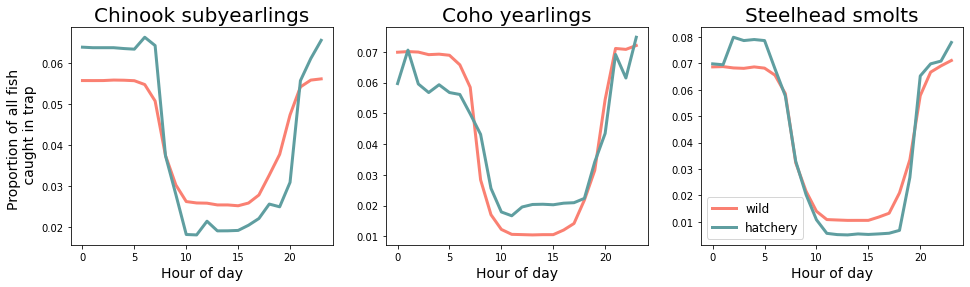

In [135]:
plt.figure(figsize=(16,4))
plt.subplot(131)
plt.plot(df_hour.index, df_hour['chinook0_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['chinook0_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 20)

plt.subplot(132)
plt.plot(df_hour.index, df_hour['coho1_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['coho1_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Coho yearlings", fontsize = 20)

plt.subplot(133)
plt.plot(df_hour.index, df_hour['steelheadsmolt_wild_count_prop'], color = "salmon", label = "wild", linewidth = 3)
plt.plot(df_hour.index, df_hour['steelheadsmolt_hatchery_count_prop'], color = "cadetblue", label = "hatchery", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left', fontsize = 12)
plt.title("Steelhead smolts", fontsize = 20)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery.jpeg')

In [79]:
counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>0,1,0)
counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>0,1,0)
counts['steelheadsmolt_hatchery_present'] = np.where(counts['steelheadsmolt_hatchery_count']>0,1,0)


<ipython-input-79-f8273ee5ad11>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['chinook0_hatchery_present'] = np.where(counts['chinook0_hatchery_count']>0,1,0)
<ipython-input-79-f8273ee5ad11>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['coho1_hatchery_present'] = np.where(counts['coho1_hatchery_count']>0,1,0)
<ipython-input-79-f8273ee5ad11>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

In [128]:
df_chinook_hour_hatchery = counts.groupby(['chinook0_hatchery_present','Hour']).agg({'chinook0_wild_count': 'sum'})
df_coho_hour_hatchery = counts.groupby(['coho1_hatchery_present','Hour']).agg({'coho1_wild_count': 'sum'})
df_steelhead_hour_hatchery = counts.groupby(['steelheadsmolt_hatchery_present','Hour']).agg({'steelheadsmolt_wild_count': 'sum'})

df_coho_hour_hatchery

coho1_wild_count
coho1_hatchery_present Hour                  
0                      0           538.425796
                       1           538.282939
                       2           537.738494
                       3           538.271828
                       4           537.730161
                       5           535.196900
                       6           502.742701
                       7           446.250499
                       8           215.509072
                       9           137.611687
                       10          111.947337
                       11           96.818824
                       12           94.394709
                       13           93.766558
                       14           94.532639
                       15           94.532639
                       16          109.318844
                       17          135.165669
                       18          203.103238
                       19          279.364850
                       20          476.759745
                       21          528.672866
                       22          540.058732
                       23          542.892066
1                      0           535.407622
                       1           538.765956
                       2           536.865956
                       3           523.465956
                       4           526.465956
                       5           523.465956
                       6           508.134587
                       7           452.310089
                       8           220.395968
                       9           124.160348
                       10           76.284035
                       11           66.806683
                       12           67.867794
                       13           67.021640
                       14           67.571640
                       15           67.571640
                       16           75.815691
                       17           82.768422
                       18          131.864618
                       19          204.293998
                       20          360.690423
                       21          563.999691
                       22          548.060370
                       23          564.637659

In [130]:
df_chinook_hour_present = (df_chinook_hour_hatchery['chinook0_wild_count'][24:]/
                           df_chinook_hour_hatchery['chinook0_wild_count'][24:].sum())
df_chinook_hour_absent = (df_chinook_hour_hatchery['chinook0_wild_count'][0:24]/
                          df_chinook_hour_hatchery['chinook0_wild_count'][0:24].sum())

df_coho_hour_present = (df_coho_hour_hatchery['coho1_wild_count'][24:]/
                        df_coho_hour_hatchery['coho1_wild_count'][24:].sum())
df_coho_hour_absent = (df_coho_hour_hatchery['coho1_wild_count'][0:24]/
                       df_coho_hour_hatchery['coho1_wild_count'][0:24].sum())

df_steelhead_hour_present = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:]/
                             df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][24:].sum())
df_steelhead_hour_absent = (df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24]/
                            df_steelhead_hour_hatchery['steelheadsmolt_wild_count'][0:24].sum())



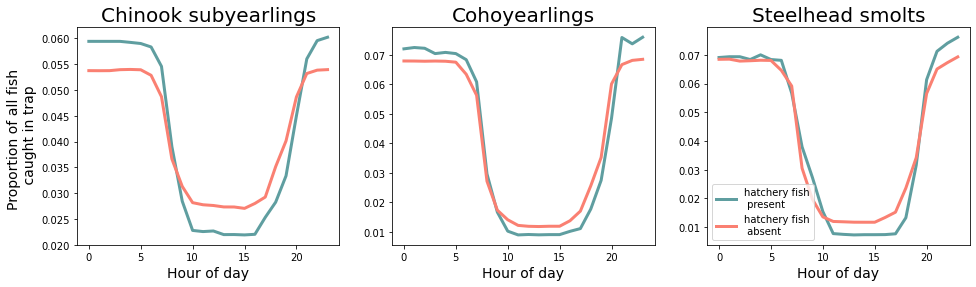

In [137]:
plt.figure(figsize=(16,4))
plt.subplot(131)
plt.plot(range(24), df_chinook_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_chinook_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Chinook subyearlings", fontsize = 20)


plt.subplot(132)
plt.plot(range(24), df_coho_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_coho_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
# plt.legend(loc ='lower left')
plt.title("Cohoyearlings", fontsize = 20)

plt.subplot(133)
plt.plot(range(24), df_steelhead_hour_present[0:24], color = "cadetblue", label = "hatchery fish\n present", linewidth = 3)
plt.plot(range(24), df_steelhead_hour_absent[0:24], color = "salmon", label = "hatchery fish\n absent", linewidth = 3)
plt.xlabel("Hour of day", fontsize = 14)
# plt.ylabel("Proportion of all fish \n caught in trap", fontsize = 14)
plt.legend(loc ='lower left')
plt.title("Steelhead smolts", fontsize = 20)

plt.savefig(output_string + '/dungeness/hour_of_day_wild_hatchery_present.jpeg')


In [144]:
# now I want to calculate proportion of fish migrating every hour by day
counts['Date'] = counts['Datetime'].dt.date

counts.groupby(['Date']).agg({'chinook0_wild_count':'sum', 'chinook0_hatchery_count':'sum', 
                     'coho1_wild_count':'sum', 'coho1_hatchery_count':'sum', 
                     'steelheadsmolt_wild_count':'sum', 'steelheadsmolt_hatchery_count':'sum'})

<ipython-input-144-bb2f2dc42183>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counts['Date'] = counts['Datetime'].dt.date


,chinook0_wild_count,chinook0_hatchery_count,coho1_wild_count,coho1_hatchery_count,steelheadsmolt_wild_count,steelheadsmolt_hatchery_count
Date,,,,,,
2005-03-08,34.400000,0.0,0.0,0.0,0.0,0.0
2005-03-09,75.907692,0.0,0.0,0.0,0.0,0.0
2005-03-10,47.978022,0.0,0.0,0.0,0.0,0.0
2005-03-11,71.175824,0.0,0.0,0.0,0.0,0.0
2005-03-12,104.076923,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
2020-08-06,8.000000,0.0,0.0,0.0,0.0,0.0
2020-08-07,12.000000,0.0,0.0,0.0,0.0,0.0
2020-08-08,12.000000,0.0,0.0,0.0,0.0,0.0


In [146]:
#pseudo code for next steps

#use df2 instead of counts and then groupby date, sum num columns

#call the num columns total (or actually could leave as is)

#then merge the df2 column with the counts columns

#then divide count column with the num column 
